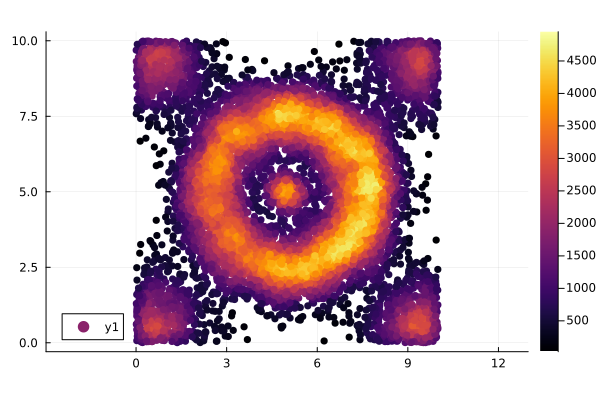

In [8]:
using DelimitedFiles
using Distances
using NearestNeighbors
using Plots
using ClusteringToMATo
gr(fmt = :png)

toy = readdlm(joinpath("..", "ToMATo","inputs","toy_example_w_density.txt"))
scatter(toy[:,1], toy[:,2], marker_z = toy[:,3], markerstrokewidth=0, aspect_ratio=1)

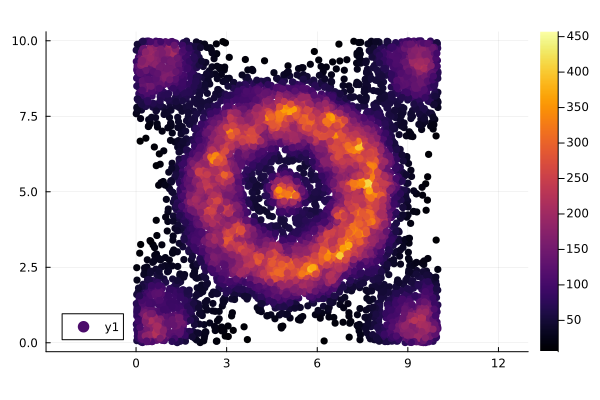

In [25]:
points = collect(transpose(toy[:,1:2]))
f = ClusteringToMATo.density_function(points, 50) .* size(points, 2)
scatter(points[1,:], points[2,:], marker_z = f, markerstrokewidth=0, aspect_ratio=1)

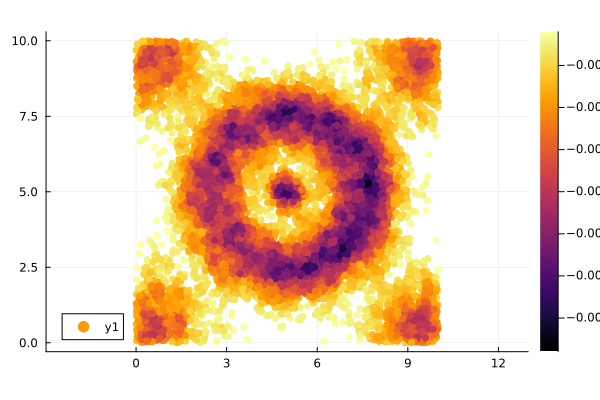

In [17]:
function ball_density(points, radius)

    n = size(points, 2)
    btree = BallTree(points)
    n_neighbors = inrangecount(btree, points, radius)

    return - (n_neighbors .+ 1) ./ n

end

f = ball_density(points, 0.25)
scatter(points[1,:], points[2,:], marker_z = f, markerstrokewidth=0, aspect_ratio=1)

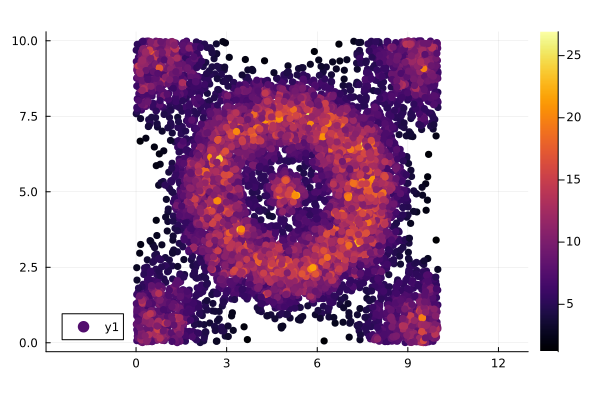

In [20]:
function distance_to_density(points, k::Int)
    d, n  = size(points)
    kdtree = KDTree(points)
    idxs, dists = knn(kdtree, points, k)
    
    f = zeros(n)
    for i = 1:n
        f[i] = sqrt(k / sum(dists[i].^2))
    end
    f
end
f = distance_to_density(points, 10)
scatter(points[1,:], points[2,:], marker_z = f, markerstrokewidth=0, aspect_ratio=1)

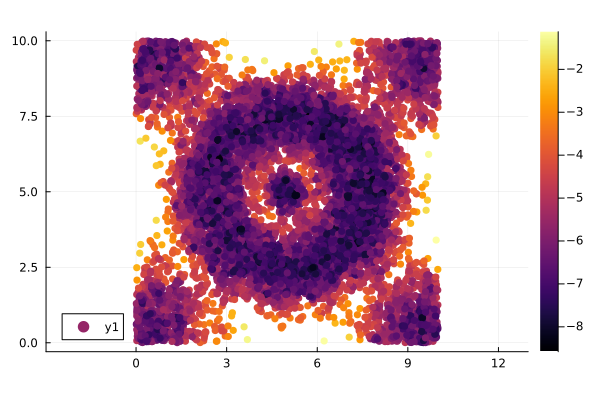

In [21]:
function gaussian_nn(points, k::Int, h)

  
    d, n  = size(points)
    kdtree = KDTree(points)
    idxs, dists = knn(kdtree, points, k)
    
    f = zeros(n)
    for i = 1:n
        f[i] = - sum(exp.(dists[i]*(-0.5)/h))
    end
    f
end
f = gaussian_nn(points, 10, 0.1)
scatter(points[1,:], points[2,:], marker_z = f, markerstrokewidth=0, aspect_ratio=1)

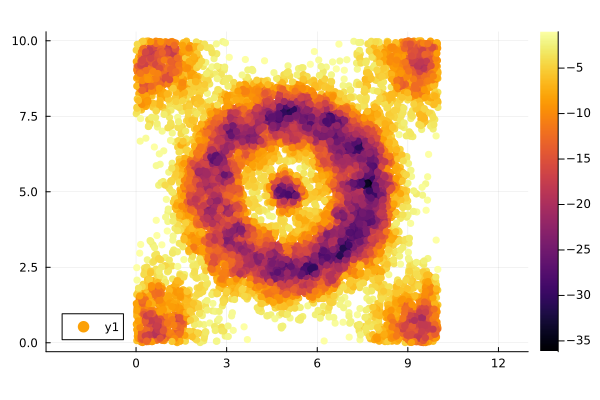

In [24]:
function gaussian_mu(points, radius, h)

    d, n  = size(points)
    btree = BallTree(points)
    idxs = inrange(btree, points, radius)
    dists = pairwise(Euclidean(), points, points, dims=2)
    f = zeros(n)
    for i = 1:n
        f[i] = - sum(exp(dists[i,j]*(-0.5)/h) for j in idxs[i])
    end
    f
end
f = gaussian_mu(points, 0.25, 0.1)
scatter(points[1,:], points[2,:], marker_z = f, markerstrokewidth=0, aspect_ratio=1)